In [2]:
# ===============================================
# 🧩 STEP 1 — Environment Setup
# ===============================================
!pip install librosa==0.10.2 soundfile==0.12.1 matplotlib==3.9.2 --quiet

print("✅ Environment ready — librosa, matplotlib installed.")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 260.0/260.0 kB 4.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 19.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.3/8.3 MB 92.3 MB/s eta 0:00:00
✅ Environment ready — librosa, noisereduce, matplotlib installed.


In [3]:
!pip install noisereduce

In [4]:
import librosa
import librosa.display
import soundfile as sf
import noisereduce as nr
import matplotlib.pyplot as plt
import numpy as np
from IPython.display import Audio, display

In [6]:
# ===============================================
# 🧩 STEP 2 — Load Audio
# ===============================================

import os
from google.colab import files

print("🎵 Upload an audio file (e.g. .wav/.mp3):")
uploaded = files.upload()

if uploaded:
    filename = list(uploaded.keys())[0]
    y, sr = librosa.load(filename, sr=None)
else:
    print("⚠️ No file uploaded, loading sample audio...")
    y, sr = librosa.load(librosa.example('trumpet'))

duration = librosa.get_duration(y=y, sr=sr)
print(f"✅ Loaded: {len(y)} samples at {sr} Hz — Duration: {duration:.2f}s")
display(Audio(y, rate=sr))


🎵 Upload an audio file (e.g. .wav/.mp3):


Saving speech_01.wav to speech_01.wav
✅ Loaded: 1036871 samples at 44100 Hz — Duration: 23.51s


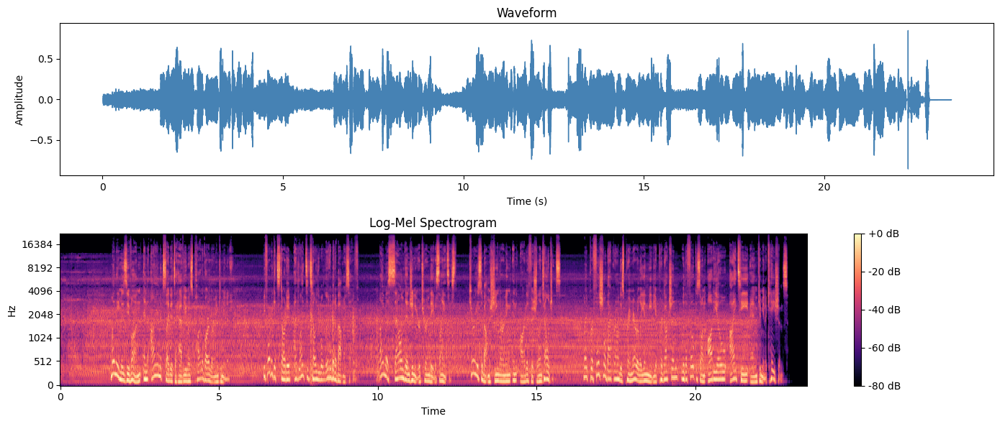

In [7]:
# ===============================================
# 🧩 STEP 3 — Create Spectrogram
# ===============================================

plt.figure(figsize=(14, 6))

# Waveform
plt.subplot(2,1,1)
librosa.display.waveshow(y, sr=sr, color='steelblue')
plt.title("Waveform")
plt.xlabel("Time (s)")
plt.ylabel("Amplitude")

# Log-Mel Spectrogram
plt.subplot(2,1,2)
S = librosa.feature.melspectrogram(y=y, sr=sr, n_fft=2048, hop_length=512, n_mels=128)
S_dB = librosa.power_to_db(S, ref=np.max)
librosa.display.specshow(S_dB, sr=sr, x_axis='time', y_axis='mel', cmap='magma')
plt.title("Log-Mel Spectrogram")
plt.colorbar(format='%+2.0f dB')

plt.tight_layout()
plt.show()

In [8]:
# ===============================================
# 🧩 STEP 4 — Noise Reduction
# ===============================================

# Select a noise profile (first 0.5s assumed noise)
noise_sample = y[0:int(0.5 * sr)]

# Apply noise reduction
y_denoised = nr.reduce_noise(y=y, y_noise=noise_sample, sr=sr)

print("✅ Noise reduction applied.")
display(Audio(y_denoised, rate=sr))

✅ Noise reduction applied.


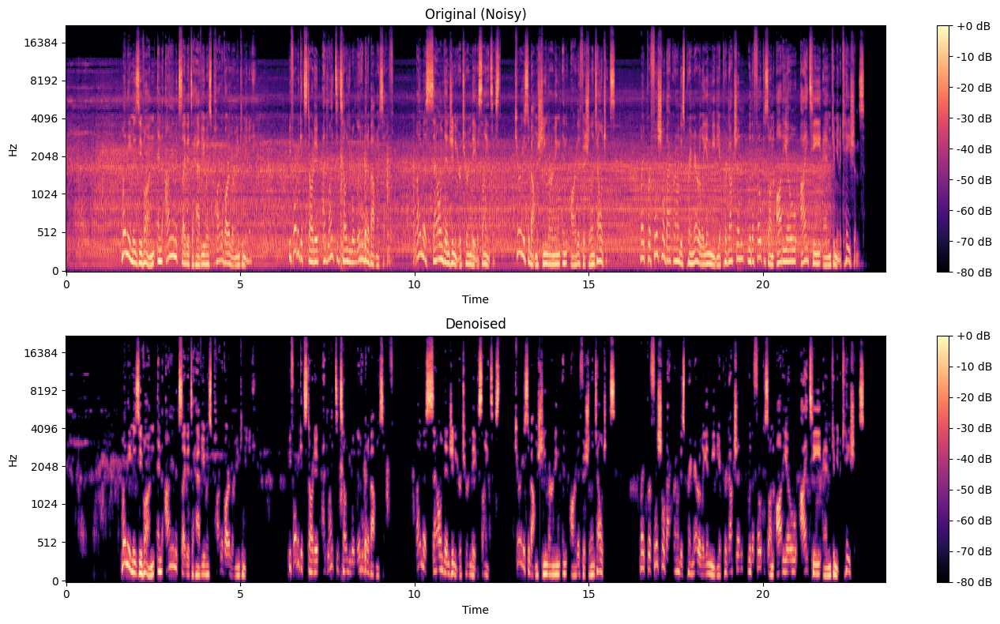

In [9]:
# ===============================================
# 🧩 STEP 5 — Compare Before vs After
# ===============================================

fig, ax = plt.subplots(2, 1, figsize=(14, 8))

S_before = librosa.power_to_db(librosa.feature.melspectrogram(y=y, sr=sr), ref=np.max)
S_after  = librosa.power_to_db(librosa.feature.melspectrogram(y=y_denoised, sr=sr), ref=np.max)

img1 = librosa.display.specshow(S_before, sr=sr, x_axis='time', y_axis='mel', cmap='magma', ax=ax[0])
ax[0].set(title='Original (Noisy)')
fig.colorbar(img1, ax=ax[0], format='%+2.0f dB')

img2 = librosa.display.specshow(S_after, sr=sr, x_axis='time', y_axis='mel', cmap='magma', ax=ax[1])
ax[1].set(title='Denoised')
fig.colorbar(img2, ax=ax[1], format='%+2.0f dB')

plt.tight_layout()
plt.show()

In [ ]:
# ===============================================
# 🧩 STEP 6 — Save Denoised Audio
# ===============================================

sf.write("denoised_output.wav", y_denoised, sr)
print("✅ Denoised file saved as 'denoised_output.wav'")
files.download("denoised_output.wav")

In [10]:
# ===============================================
# 🧩 STEP 6 — Adaptive Wiener Filtering (Dynamic Noise Reduction)
# ===============================================
from scipy.signal import wiener

# Apply Wiener filter for adaptive smoothing / noise reduction
# It adapts to local variance → preserves speech formants while reducing background noise
y_wiener = wiener(y)

print("✅ Adaptive Wiener filtering applied.")
display(Audio(y_wiener, rate=sr))

✅ Adaptive Wiener filtering applied.


/usr/local/lib/python3.12/dist-packages/scipy/signal/_signaltools.py:1783: RuntimeWarning: divide by zero encountered in divide
  res *= (1 - noise / lVar)
/usr/local/lib/python3.12/dist-packages/scipy/signal/_signaltools.py:1783: RuntimeWarning: invalid value encountered in multiply
  res *= (1 - noise / lVar)


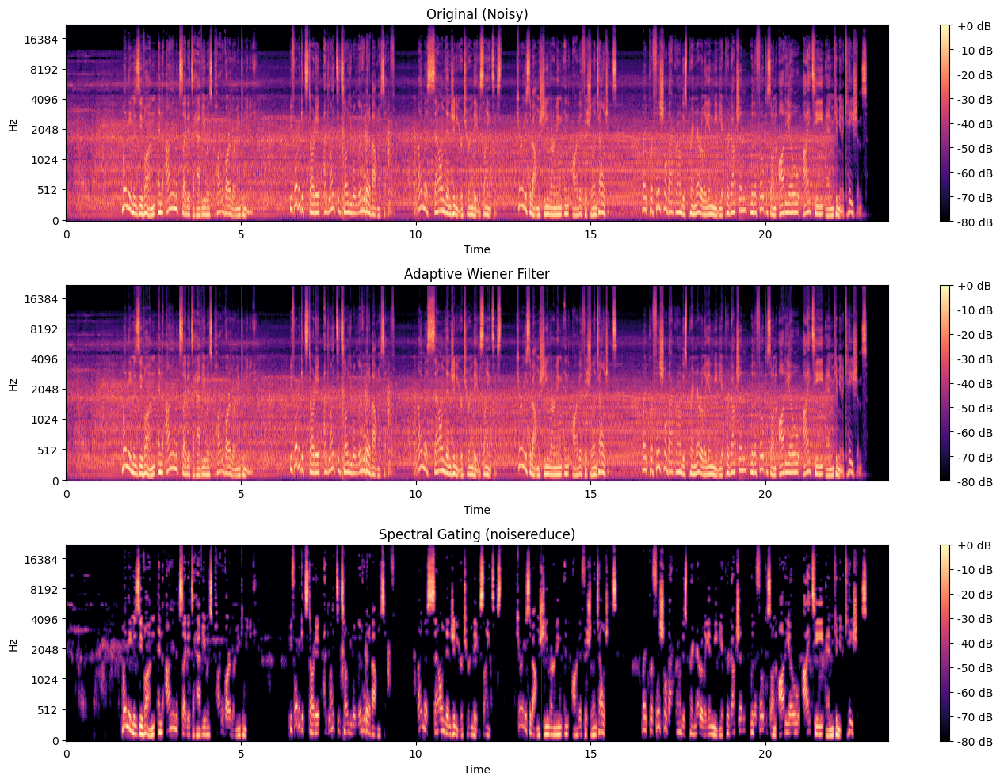

In [11]:
# ===============================================
# 🧩 STEP 7 — Compare Spectrograms (Original vs Wiener vs Spectral Gating)
# ===============================================

fig, ax = plt.subplots(3, 1, figsize=(14, 10))

# Original
S_orig = librosa.power_to_db(librosa.feature.melspectrogram(y=y, sr=sr), ref=np.max)
img1 = librosa.display.specshow(S_orig, sr=sr, x_axis='time', y_axis='mel', cmap='magma', ax=ax[0])
ax[0].set(title='Original (Noisy)')
fig.colorbar(img1, ax=ax[0], format='%+2.0f dB')

# Wiener filtered
S_wiener = librosa.power_to_db(librosa.feature.melspectrogram(y=y_wiener, sr=sr), ref=np.max)
img2 = librosa.display.specshow(S_wiener, sr=sr, x_axis='time', y_axis='mel', cmap='magma', ax=ax[1])
ax[1].set(title='Adaptive Wiener Filter')
fig.colorbar(img2, ax=ax[1], format='%+2.0f dB')

# Spectral gating (noisereduce)
S_nr = librosa.power_to_db(librosa.feature.melspectrogram(y=y_denoised, sr=sr), ref=np.max)
img3 = librosa.display.specshow(S_nr, sr=sr, x_axis='time', y_axis='mel', cmap='magma', ax=ax[2])
ax[2].set(title='Spectral Gating (noisereduce)')
fig.colorbar(img3, ax=ax[2], format='%+2.0f dB')

plt.tight_layout()
plt.show()

📊 Estimated SNR (Adaptive Wiener): 23.75 dB
📊 Estimated SNR (Spectral Gating): 2.13 dB


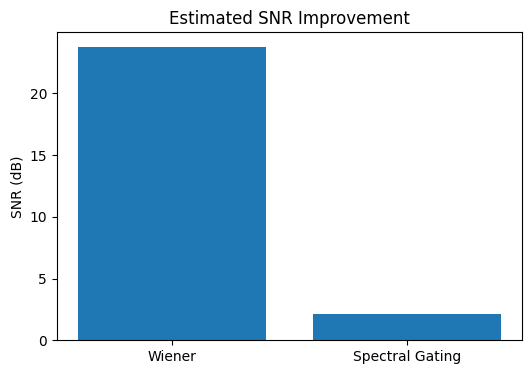

In [12]:
# ===============================================
# 🧩 STEP 8 — Compute SNR Improvement
# ===============================================

def compute_snr(clean_signal, processed_signal):
    """Estimate SNR improvement between original and processed signals."""
    noise_component = clean_signal - processed_signal
    snr = 10 * np.log10(np.sum(clean_signal**2) / np.sum(noise_component**2))
    return snr

snr_wiener = compute_snr(y, y_wiener)
snr_nr = compute_snr(y, y_denoised)

print(f"📊 Estimated SNR (Adaptive Wiener): {snr_wiener:.2f} dB")
print(f"📊 Estimated SNR (Spectral Gating): {snr_nr:.2f} dB")

# Visualize comparison
plt.figure(figsize=(6,4))
plt.bar(['Wiener', 'Spectral Gating'], [snr_wiener, snr_nr])
plt.title("Estimated SNR Improvement")
plt.ylabel("SNR (dB)")
plt.show()

In [2]:
# Additional dependencies
!pip install denoiser

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.8/49.8 kB 3.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.6/59.6 kB 6.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 72.1/72.1 kB 7.6 MB/s eta 0:00:00
  Created wheel for denoiser: filename=denoiser-0.1.5-py3-none-any.whl size=43818 sha256=dcb144ac300031cebbb5891c865a90d105ebf24c8b8c44af27c95f8dc7ad62eb
  Stored in directory: /root/.cache/pip/wheels/94/de/75/9f23404118ee9e373bc29792ff2017255f3ed611905abe6610
  Created wheel for julius: filename=julius-0.2.7-py3-none-any.whl size=21870 sha256=ec0b8a12845a2d114efcc94c9022a66f536c1076b9789e369a9e58404b05f243
  Stored in directory: /root/.cache/pip/wheels/de/c1/ca/544dafe48401e8e2e17064dfe465a390fca9e8720ffa12e744
Successfully built denoiser julius
  Attempting uninstall: omegaconf
    Found existing installation: omegaconf 2.3.0
    Uninstalling omegaconf-2.3.0:
      Succ

In [4]:
import torch
import torchaudio
import librosa
from denoiser import pretrained

# Detect device
device = 'cuda' if torch.cuda.is_available() else 'cpu'
print("Using device:", device)

# Load pretrained model
model = pretrained.dns64().to(device)
model.eval()

# Load your noisy audio
file_path = "/content/speech_01.wav"
wav, sr = torchaudio.load(file_path)

# Convert to mono if needed
if wav.shape[0] > 1:
    wav = torch.mean(wav, dim=0, keepdim=True)

# (Optional) resample to 48kHz for dns64 model
target_sr = 48000
if sr != target_sr:
    wav = torchaudio.functional.resample(wav, orig_freq=sr, new_freq=target_sr)
    sr = target_sr

# Move tensor to correct device
wav = wav.to(device)

# Run inference
with torch.no_grad():
    enhanced = model(wav)[0].cpu()

# Save enhanced audio
out_path = "enhanced_denoiser.wav"
torchaudio.save(out_path, enhanced, sr)

print(f"✅ Denoiser output saved to {out_path}")

Using device: cuda
✅ Denoiser output saved to enhanced_denoiser.wav


/usr/local/lib/python3.12/dist-packages/torchaudio/_backend/utils.py:337: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.save_with_torchcodec` under the hood. Some parameters like format, encoding, bits_per_sample, buffer_size, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's encoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.encoders.AudioEncoder
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchaudio/_backend/ffmpeg.py:247: UserWarning: torio.io._streaming_media_encoder.StreamingMediaEncoder has been deprecated. This deprecation is part of a large refactoring effort to transition TorchAudio into a maintenance phase. The decoding and encoding capabilities of PyTorch for both audio and video are being consolidated into TorchCodec. Please see https://github.com/pytorch/audio/issues/3902 for more information. It will be removed from the 2.9 release. 
  s 